# Investigating Global Emissions: National Footprint Accounts Dataset (1961-2013)
## How can data on resource consumption be utilized to analyze the dynamics of global emissions, leading to evidence-based strategies for mitigating climate change?

<img src="images/footprint.jpeg" alt="Footprint in a forest" width="800"/>

### Introduction

The National Footprint Accounts provide a comprehensive dataset that tracks the ecological resource use and resource capacity of nations from 1961 onwards. By analyzing this data, we hope to uncover patterns and trends that could shed light on how human activities have influenced global emissions over time.

The insights derived from this analysis could provide valuable information for policymakers, researchers, and anyone interested in reducing global emissions. By understanding the past and present, we can make informed decisions about the future and contribute to the global efforts in combating climate change.

In [2]:
#importing libraries to help us in probabilistic programming, clustering, performing time-series analysis and visualizations.

import numpy as np
np.random.seed(0)
import pymc3 as pm
from sklearn.cluster import KMeans
import arviz as az
import pandas as pd
from scipy import stats
import math
import matplotlib.pyplot as plt
%matplotlib inline

## National Footprint Accounts (NFA) Dataset
Global Footprint Network. https://www.footprintnetwork.org/resources/data/.

The National Footprint Accounts (NFA) dataset is a comprehensive resource that tracks the ecological resource use and resource capacity of nations over time¹. This dataset is the most widely used for Ecological Footprint (EF) analysis worldwide³.


**Total Ecological Footprint** across the world measuring how much demand human consumption places on the biosphere:
<img src="images/efchart.png" width="800"/>

The NFA dataset is based on approximately **15,000 data points per country per year**¹. It calculates the Footprints of more than **200 countries, territories, and regions from 1961 to the present**¹. The calculations in the NFA are based on United Nations or UN-affiliated datasets, including those published by the Food and Agriculture Organization, United Nations Commodity Trade Statistics Database, and the UN Statistics Division, as well as the International Energy Agency¹.

The dataset measures the amount of biologically productive land and sea area available to provide the resources a population consumes and to absorb its wastes, given current technology and management practices¹. It also tracks how much biologically productive area it takes to provide for all the competing demands of people¹.

In [9]:
df = pd.read_csv("NFA 2017 Edition.csv")
pd.set_option('display.max_colwidth', None)

C:\Users\Abhinav Uni\AppData\Local\Temp\ipykernel_2652\1618232535.py:1: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("NFA 2017 Edition.csv")


In [10]:
df

,country,year,country_code,record,crop_land,grazing_land,forest_land,fishing_ground,built_up_land,carbon,total,QScore
0,Armenia,1992,1,AreaPerCap,0.140020,0.199159,0.097000,0.036817,0.029258,0.000000,5.022540e-01,5
1,Armenia,1992,1,AreaTotHA,483000.000000,687000.000000,334600.000000,127000.000000,100925.003052,0.000000,1.732525e+06,5
2,Armenia,1992,1,BiocapPerCap,0.276531,0.134892,0.083839,0.013705,0.057782,0.000000,5.667493e-01,5
3,Armenia,1992,1,BiocapTotGHA,953895.034844,465308.532841,289203.573356,47274.017744,199320.619674,0.000000,1.955002e+06,5
4,Armenia,1992,1,EFConsPerCap,0.477412,0.175880,0.000001,0.004113,0.057782,1.097617,1.812806e+00,5
...,...,...,...,...,...,...,...,...,...,...,...,...
99451,Saint Vincent and Grenadines,2013,191,EFExportsTotGHA,NaN,NaN,NaN,NaN,NaN,NaN,2.662819e+04,2
99452,Saint Vincent and Grenadines,2013,191,EFImportsPerCap,NaN,NaN,NaN,NaN,NaN,NaN,1.499775e+00,2
99453,Saint Vincent and Grenadines,2013,191,EFImportsTotGHA,NaN,NaN,NaN,NaN,NaN,NaN,1.639659e+05,2
99454,Saint Vincent and Grenadines,2013,191,EFProdPerCap,NaN,NaN,NaN,NaN,NaN,NaN,2.168756e+00,2


## Data Cleaning: Handling Null/Missing Values
During our initial data exploration, we discovered that some countries did not have recorded values for land or carbon emissions. This could be due to a lack of data collection in these regions, or it could indicate that these countries did not emit any carbon, which seems highly unlikely given the global nature of carbon emissions.

In [11]:
missing_values = df.isnull().sum()
missing_values

country               0
year                  0
country_code          0
record                0
crop_land         18216
grazing_land      18216
forest_land       18216
fishing_ground    18216
built_up_land     18216
carbon            18216
total                 0
QScore                0
dtype: int64

To ensure the accuracy and reliability of our analysis, we made the decision to exclude these records from our dataset. This step is crucial in optimizing our analysis as it helps to prevent potential skewing of our results due to incomplete or inaccurate data.

By doing so, we are focusing our analysis on more reliable and complete data, thereby enhancing the validity of our insights and conclusions. This rigorous approach to data cleaning underscores our commitment to delivering a robust and meaningful analysis of global emissions trends.

In [12]:
# drop the rows that has NaN values

df = df.dropna()
df

,country,year,country_code,record,crop_land,grazing_land,forest_land,fishing_ground,built_up_land,carbon,total,QScore
0,Armenia,1992,1,AreaPerCap,0.140020,0.199159,0.097000,3.681693e-02,0.029258,0.000000,5.022540e-01,5
1,Armenia,1992,1,AreaTotHA,483000.000000,687000.000000,334600.000000,1.270000e+05,100925.003052,0.000000,1.732525e+06,5
2,Armenia,1992,1,BiocapPerCap,0.276531,0.134892,0.083839,1.370460e-02,0.057782,0.000000,5.667493e-01,5
3,Armenia,1992,1,BiocapTotGHA,953895.034844,465308.532841,289203.573356,4.727402e+04,199320.619674,0.000000,1.955002e+06,5
4,Armenia,1992,1,EFConsPerCap,0.477412,0.175880,0.000001,4.113147e-03,0.057782,1.097617,1.812806e+00,5
...,...,...,...,...,...,...,...,...,...,...,...,...
99355,Vanuatu,2013,155,EFExportsTotGHA,26579.249964,661.594604,6037.791864,6.828280e+05,0.000000,10838.670256,7.269453e+05,3L
99356,Vanuatu,2013,155,EFImportsPerCap,0.103218,0.040232,0.039395,7.262617e-02,0.000000,0.243803,4.992746e-01,3L
99357,Vanuatu,2013,155,EFImportsTotGHA,26131.183585,10185.274161,9973.483797,1.838640e+04,0.000000,61722.504997,1.263989e+05,3L
99358,Vanuatu,2013,155,EFProdPerCap,0.958186,0.075730,0.245805,4.504165e+00,0.000000,0.145292,5.929177e+00,3L


**country**: The name of the country to which the data row pertains.

**year**: The calendar year for which the data is recorded.

**country_code**: A unique numerical identifier assigned to each country.

**record**: The type of data record, which could indicate whether the data is per capita, total area, or another metric.

**crop_land**: The area of land used for crop production within the country, typically measured in hectares or global hectares.

**grazing_land**: The area of land designated for grazing livestock within the country.

**forest_land**: The area covered by forests within the country, reflecting the extent of forested land used for various purposes.

**fishing_ground**: The water area used for fishing, indicating the country's dependency on aquatic resources.

**built_up_land**: The area occupied by human infrastructure like buildings, roads, and other constructions.

**carbon**: A representation of the carbon footprint, indicating the amount of forest land required to sequester the carbon dioxide emissions of the country.

<img src="images/Footprinttype.png" width="800"/>

In [5]:
df.head(20)

,country,year,country_code,record,crop_land,grazing_land,forest_land,fishing_ground,built_up_land,carbon,total,QScore
0,Armenia,1992,1,AreaPerCap,1.400203e-01,0.199159,0.097000,0.036817,0.029258,0.000000e+00,5.022540e-01,5
1,Armenia,1992,1,AreaTotHA,4.830000e+05,687000.000000,334600.000000,127000.000000,100925.003052,0.000000e+00,1.732525e+06,5
2,Armenia,1992,1,BiocapPerCap,2.765314e-01,0.134892,0.083839,0.013705,0.057782,0.000000e+00,5.667493e-01,5
3,Armenia,1992,1,BiocapTotGHA,9.538950e+05,465308.532841,289203.573356,47274.017744,199320.619674,0.000000e+00,1.955002e+06,5
4,Armenia,1992,1,EFConsPerCap,4.774125e-01,0.175880,0.000001,0.004113,0.057782,1.097617e+00,1.812806e+00,5
5,Armenia,1992,1,EFConsTotGHA,1.646834e+06,606697.374570,4.328034,14188.301981,199320.619674,3.786229e+06,6.253274e+06,5
6,Armenia,1992,1,EFExportsPerCap,1.535785e-03,0.002071,0.000000,0.000449,0.000000,4.744830e-02,5.150366e-02,5
7,Armenia,1992,1,EFExportsTotGHA,5.297689e+03,7143.838664,0.000000,1547.439795,0.000000,1.636729e+05,1.776619e+05,5
8,Armenia,1992,1,EFImportsPerCap,2.024169e-01,0.056342,0.000001,0.003299,0.000000,8.822890e-02,3.502881e-01,5
9,Armenia,1992,1,EFImportsTotGHA,6.982370e+05,194350.774605,4.328034,11381.057213,0.000000,3.043456e+05,1.208319e+06,5


In [13]:
unique_records = df['record'].unique()
unique_records

array(['AreaPerCap', 'AreaTotHA', 'BiocapPerCap', 'BiocapTotGHA',
       'EFConsPerCap', 'EFConsTotGHA', 'EFExportsPerCap',
       'EFExportsTotGHA', 'EFImportsPerCap', 'EFImportsTotGHA',
       'EFProdPerCap', 'EFProdTotGHA'], dtype=object)

#### There are, in total, 12 types of unique records that provide information on the geography, demographics and resource consumption, production, imports & exports.

#### For each country we have reocrds based on total populations and based on individuals (Per Capita).

#### In Totals:
1. **AreaTotHA**: "Area Total in Hectares" – Likely indicates the total area of a specific type of land in hectares for a given country or region.
2. **BiocapTotGHA**: "Biocapacity Total in Global Hectares" – Represents the total biocapacity of a region, measured in global hectares, which adjusts for the productivity of different ecosystems.
3. **EFConsTotGHA**: "Ecological Footprint of Consumption Total in Global Hectares" – Indicates the total ecological footprint of consumption for a country or region, measured in global hectares.
4. **EFExportsTotGHA**: "Ecological Footprint of Exports Total in Global Hectares" – Represents the total ecological footprint of a country's exports, measured in global hectares.
5. **EFImportsTotGHA**: "Ecological Footprint of Imports Total in Global Hectares" – Represents the total ecological footprint of imports for a country or region, measured in global hectares.
6. **EFProdTotGHA**: "Ecological Footprint of Production Total in Global Hectares" – Indicates the total ecological footprint of production in a region, accounting for all goods and services produced, measured in global hectares.

#### Per Capita:
7. **AreaPerCap**: "Area Per Capita" – Represents the amount of a particular type of land (e.g., crop land, forest land) available per person in a specific country or region.
8. **BiocapPerCap**: "Biocapacity Per Capita" – Represents the amount of biologically productive land and water area an ecosystem has per person, measured in global hectares.
9. **EFConsPerCap**: "Ecological Footprint of Consumption Per Capita" – Represents the ecological footprint caused by the average person's consumption, measured in global hectares.
10. **EFExportsPerCap**: "Ecological Footprint of Exports Per Capita" – Represents the ecological footprint associated with the goods and services a country exports per person, measured in global hectares.
11. **EFImportsPerCap**: "Ecological Footprint of Imports Per Capita" – Represents the ecological footprint of all goods and services imported by a country per person, measured in global hectares.
12. **EFProdPerCap**: "Ecological Footprint of Production Per Capita" – Represents the ecological footprint associated with domestic production consumed by residents per person, measured in global hectares.


In [6]:
df.describe

<bound method NDFrame.describe of        country  year  country_code           record      crop_land  \
0      Armenia  1992             1       AreaPerCap       0.140020   
1      Armenia  1992             1        AreaTotHA  483000.000000   
2      Armenia  1992             1     BiocapPerCap       0.276531   
3      Armenia  1992             1     BiocapTotGHA  953895.034844   
4      Armenia  1992             1     EFConsPerCap       0.477412   
...        ...   ...           ...              ...            ...   
99355  Vanuatu  2013           155  EFExportsTotGHA   26579.249964   
99356  Vanuatu  2013           155  EFImportsPerCap       0.103218   
99357  Vanuatu  2013           155  EFImportsTotGHA   26131.183585   
99358  Vanuatu  2013           155     EFProdPerCap       0.958186   
99359  Vanuatu  2013           155     EFProdTotGHA  242579.122476   

        grazing_land    forest_land  fishing_ground  built_up_land  \
0           0.199159       0.097000    3.681693e-02    

### Data Segmentation: Total Records vs Per Capita Records

#### In order to conduct a comprehensive and nuanced analysis, we have divided our dataset into two distinct subsets: `Total Records` and `Per Capita Records`.

#### 1. Total Records

The `Total Records` subset includes fields that represent the total ecological footprint, including the total area, total biocapacity, total consumption, total exports, total imports, and total production. By examining these total values, we can gain insights into the overall scale and impact of global emissions.

#### 2. Per Capita Records

The `Per Capita Records` subset includes fields that represent the ecological footprint on a per capita basis. This allows us to understand the emissions impact on an individual level, providing a more personalized perspective.

By segmenting our data in this way, we can conduct a more detailed and targeted analysis, enabling us to uncover deeper insights and draw more meaningful conclusions about global emissions trends. This rigorous approach to data segmentation underscores our commitment to delivering a robust and meaningful analysis of global emissions trends.

In [14]:
total_records = ['AreaTotHA', 'BiocapTotGHA', 'EFConsTotGHA', 'EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA']
per_cap_records = ['AreaPerCap', 'BiocapPerCap', 'EFConsPerCap', 'EFExportsPerCap', 'EFImportsPerCap', 'EFProdPerCap']

df_total = df[df['record'].isin(total_records)]
df_per_cap = df[df['record'].isin(per_cap_records)]

In [9]:
df_total['country'].unique()

array(['Armenia', 'Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Argentina', 'Australia', 'Austria', 'Barbados', 'Bangladesh',
       'Bhutan', 'Bolivia', 'Brazil', 'Bulgaria', 'Myanmar', 'Burundi',
       'Cameroon', 'Canada', 'Central African Republic', 'Sri Lanka',
       'Chad', 'Chile', 'Colombia', 'Congo', 'Costa Rica', 'Cuba',
       'Cyprus', 'Czechoslovakia', 'Azerbaijan', 'Benin', 'Denmark',
       'Dominica', 'Dominican Republic', 'Belarus', 'Egypt',
       'El Salvador', 'Ethiopia PDR', 'Estonia', 'Fiji', 'France',
       'French Polynesia', 'Gambia', 'Germany', 'Bosnia and Herzegovina',
       'Ghana', 'Greece', 'Guadeloupe', 'Guatemala', 'Guinea', 'Guyana',
       'Haiti', 'Hungary', 'Croatia', 'India', 'Indonesia', 'Ireland',
       'Israel', 'Italy', "Côte d'Ivoire", 'Japan', 'Jordan', 'Kenya',
       "Korea, Democratic People's Republic of", 'Korea, Republic of',
       'Latvia', "Lao People's Democratic Republic", 'Lebanon',
       'Lithuania', 'Madagascar', '

#### Observation: We notice that a 'World' country is included which may cause double-counting during analysis and while building models.

### Data Refinement: Excluding Global Records

In our pursuit of accurate and meaningful insights, we have decided to exclude records that are labeled as 'World' from both our `Total Records` and `Per Capita Records` subsets. 

The rationale behind this decision is to avoid potential double counting. The 'World' records likely aggregate the data of all individual countries, and including these in our analysis could inadvertently inflate the numbers and distort our findings.

By focusing on country-specific data, we can ensure a more accurate representation of global emissions trends. This step further refines our dataset and enhances the reliability of our subsequent analysis. It's a testament to our commitment to rigorous data analysis and our pursuit of truth through data.

In [15]:
df_total = df_total[df_total['country'] != 'World']
df_per_cap = df_per_cap[df_per_cap['country'] != 'World']

### Descriptive Statistics: Total Records

In this section, we will generate descriptive statistics for each record type in our `Total Records` subset. The statistics will be generated for the following columns: `crop_land`, `grazing_land`, `forest_land`, `fishing_ground`, `built_up_land`, and `carbon`.

For each record type, we will filter the data for the current record type and generate descriptive statistics for the specified columns. These statistics will provide a summary of central tendency, dispersion, and shape of the distribution of these columns, providing a deeper understanding of our data.

This process will be repeated for each record type in our `Total Records` subset. The output will provide a comprehensive statistical summary for each record type, offering valuable insights into the distribution and characteristics of our data.

In [16]:
columns = ['crop_land', 'grazing_land', 'forest_land', 'fishing_ground', 'built_up_land', 'carbon']


for record_type in total_records:
    print(f"Descriptive statistics for {record_type}:")
    data = df_total[df_total['record'] == record_type]
    description = data[columns].describe()
    print(description)
    print("\n")


Descriptive statistics for AreaTotHA:
          crop_land  grazing_land   forest_land  fishing_ground  \
count  6.717000e+03  6.717000e+03  6.717000e+03    6.717000e+03   
mean   1.114217e+07  2.196265e+07  3.093074e+07    2.107364e+07   
std    2.895447e+07  6.149189e+07  9.643358e+07    6.243728e+07   
min    6.700000e+02  0.000000e+00  0.000000e+00    0.000000e+00   
25%    1.042000e+06  6.000000e+05  1.080722e+06    4.263000e+05   
50%    3.118000e+06  2.770207e+06  4.888231e+06    3.350100e+06   
75%    7.688399e+06  1.510000e+07  1.708545e+07    9.245100e+06   
max    2.403000e+08  4.670956e+08  8.495637e+08    4.821192e+08   

       built_up_land  carbon  
count   6.717000e+03  6717.0  
mean    9.947026e+05     0.0  
std     2.783321e+06     0.0  
min     0.000000e+00     0.0  
25%     1.053030e+05     0.0  
50%     3.188580e+05     0.0  
75%     7.568750e+05     0.0  
max     3.109140e+07     0.0  


Descriptive statistics for BiocapTotGHA:
          crop_land  grazing_land   

This rigorous approach to data analysis ensures that we have a thorough understanding of our dataset, enabling us to draw more accurate and meaningful conclusions from our analysis.

By understanding the descriptive statistics of our data, we can better interpret the results of our analysis and make more informed decisions about our modeling strategies.

### Analyzing Ecological Footprint for Consumption (1960-2013)

#### Data Preparation and Filtering:
This section begins by filtering the dataset to extract rows corresponding specifically to the ecological footprint for consumption (`EFConsTotGHA`). Additionally, it extracts data related to total biocapacity (`BiocapTotGHA`) for reference.

#### Calculating Ecological Footprint:
Following data extraction, the code computes the total land and carbon ecological footprints for consumption. The total land footprint is derived by aggregating various land use components, including crop land, grazing land, forest land, fishing ground, and built-up land. Meanwhile, the total carbon footprint is calculated separately.

#### Analyzing Trends:
To gain insights into the ecological dynamics over time, the code calculates the percentage change in both total land and carbon footprints from year to year. These metrics provide a nuanced understanding of how ecological footprints have evolved throughout the analyzed period.

#### Visualizing Trends:
The analysis culminates in the visualization of trends in total land and carbon footprints for consumption. Two separate plots depict these trends over the years, offering a graphical representation of the ecological impact dynamics. 

#### Interpretation:
Through this analysis and visualization, we aim to uncover patterns and trends in ecological footprints for consumption, contributing to a deeper understanding of sustainability and environmental management practices over the specified timeframe.

Mean percentage change in Total Land EF for Consumption from 1960 to 2013:
Consumption: 1.462907537040904%
Mean percentage change in Total Carbon EF for Consumption from 1960 to 2013:
Consumption: 2.847512069088%


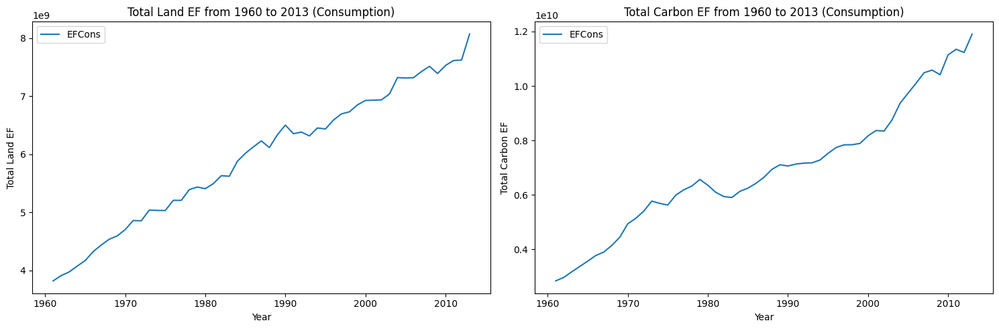

In [17]:
df_efcons = df_total[df_total['record'] == 'EFConsTotGHA']
df_biocap = df_total[df_total['record'] == 'BiocapTotGHA']

total_land_efcons_by_year = df_efcons.groupby('year')[['crop_land', 'grazing_land', 'forest_land', 'fishing_ground', 'built_up_land']].sum().sum(axis=1)
total_carbon_efcons_by_year = df_efcons.groupby('year')['carbon'].sum()

land_efcons_pct_change = total_land_efcons_by_year.pct_change()
carbon_efcons_pct_change = total_carbon_efcons_by_year.pct_change()
mean_land_efcons_pct_change = land_efcons_pct_change.mean()
mean_carbon_efcons_pct_change = carbon_efcons_pct_change.mean()

print(f'Mean percentage change in Total Land EF for Consumption from 1960 to 2013:')
print(f'Consumption: {mean_land_efcons_pct_change * 100}%')

print(f'Mean percentage change in Total Carbon EF for Consumption from 1960 to 2013:')
print(f'Consumption: {mean_carbon_efcons_pct_change * 100}%')

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

ax[0].plot(total_land_efcons_by_year.index, total_land_efcons_by_year, label='EFCons')
ax[0].set_title('Total Land EF from 1960 to 2013 (Consumption)')
ax[0].set_xlabel('Year')
ax[0].set_ylabel('Total Land EF')
ax[0].legend()

ax[1].plot(total_carbon_efcons_by_year.index, total_carbon_efcons_by_year, label='EFCons')
ax[1].set_title('Total Carbon EF from 1960 to 2013 (Consumption)')
ax[1].set_xlabel('Year')
ax[1].set_ylabel('Total Carbon EF')
ax[1].legend()

plt.tight_layout()
plt.show()

#### Inference: Based on our analysis, it is evident that global emissions have been consistently increasing at a certain percentage. This trend is a significant concern given the potential impacts on climate change and overall planetary health. 
#### Question: What factors are driving this consistent increase in emissions? Identifying the parameters that most significantly contribute to this growth in emissions is crucial for devising effective strategies to mitigate them.

### Exploring Global Ecological Footprint and Biocapacity (1960-2013)

#### Calculation of Total Ecological Footprint:
The code begins by calculating the total ecological footprint for each year across all ecological footprint types (EFConsTotGHA). This metric provides a comprehensive overview of humanity's impact on the environment over time.

#### Calculation of Total Biocapacity:
In parallel, the total biocapacity for each year is computed. This metric represents the Earth's capacity to regenerate renewable resources and absorb waste generated by human activities.

#### Data Preparation for Visualization:
To facilitate visualization, the calculated total ecological footprint and total biocapacity are structured into a DataFrame. This DataFrame juxtaposes the world's ecological footprint and biocapacity for each year, enabling a comparative analysis.

#### Visualizing Ecological Footprint and Biocapacity Trends:
The analysis culminates in a line plot showcasing the trends in both the world's ecological footprint and biocapacity from 1960 to 2013. This visualization offers insights into the balance (or imbalance) between human consumption and the Earth's capacity to regenerate resources and absorb emissions.

#### Interpretation:
By examining the trends in global ecological footprint and biocapacity, we gain valuable insights into humanity's ecological impact and the sustainability of current consumption patterns. This analysis prompts reflection on the need for responsible resource management and conservation efforts to ensure a sustainable future.

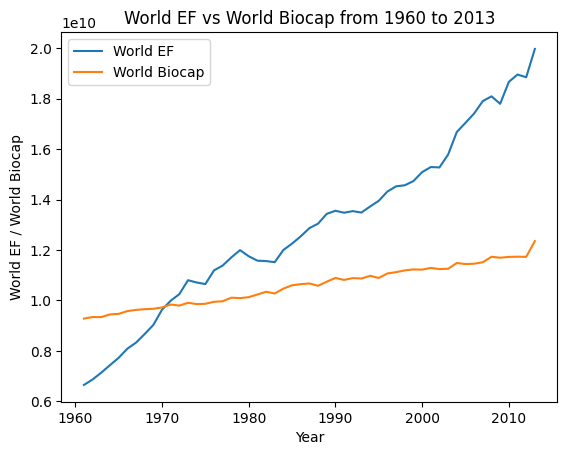

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

total_efcons_by_year = df_efcons.groupby('year')['total'].sum()

total_biocap_by_year = df_biocap.groupby('year')[['crop_land', 'grazing_land', 'forest_land', 'fishing_ground', 'built_up_land']].sum().sum(axis=1)

df_plot = pd.DataFrame({
    'World EF': total_efcons_by_year,
    'World Biocap': total_biocap_by_year
})

df_plot.plot(kind='line', title='World EF vs World Biocap from 1960 to 2013')
plt.xlabel('Year')
plt.ylabel('World EF / World Biocap')
plt.show()

#### Inference: The depletion of planetary health can be attributed to our inability to increase our biocapacity while simultaneously overusing it, leading to increased emissions. This imbalance between our ecological footprint and biocapacity is a key factor in the ongoing environmental challenges we face. It underscores the urgent need for strategies that can effectively manage and reduce our ecological footprint.

### Assessing Biocapacity and Ecological Footprint on a Country Level

#### ECOLOGICAL DEFICIT/RESERVE
An ecological deficit occurs when the Ecological Footprint of a population exceeds the biocapacity of the area available to that population. A national ecological deficit means that the country is net-importing biocapacity through trade, liquidating national ecological assets or emitting more carbon dioxide waste into the atmosphere than its own ecosystems absorb. In contrast, an ecological reserve exists when the biocapacity of a region exceeds its population's Ecological Footprint.

#### Calculating Biocapacity and Ecological Footprint:
The code undertakes a detailed examination of biocapacity and ecological footprint data on a country level. It starts by calculating the total biocapacity and ecological footprint for each year across different land use categories and carbon emissions.

#### Determining Biocapacity Reserves and Deficits:
Based on the computed biocapacity and ecological footprint, the code further calculates the difference between biocapacity and ecological footprint for each year and country. This difference serves as a crucial indicator, delineating whether a country operates within its biocapacity ("Reserve") or exceeds it ("Deficit").

#### Classification of Biocapacity Status:
To facilitate analysis and interpretation, the code classifies each year and country pair into one of two categories: "Reserve" or "Deficit," based on the computed biocapacity difference. This classification offers insights into the ecological sustainability of each country's resource utilization practices over time.

#### Constructing a DataFrame for Analysis:
The results of the biocapacity assessment, including the computed biocapacity values and their respective classifications, are organized into a structured DataFrame. This DataFrame provides a comprehensive overview of biocapacity status for each year and country, facilitating further analysis and visualization.

#### Interpretation and Implications:
By examining biocapacity reserves and deficits at a country level, we gain valuable insights into the sustainability of resource consumption practices worldwide. This analysis prompts reflection on the need for balanced resource management strategies and conservation efforts to ensure global ecological sustainability.

In [20]:
total_biocap_by_year_country = df_biocap.groupby(['year', 'country'])[['crop_land', 'grazing_land', 'forest_land', 'fishing_ground', 'built_up_land']].sum().sum(axis=1)

total_efcons_by_year_country = df_efcons.groupby(['year', 'country'])[['crop_land', 'grazing_land', 'forest_land', 'fishing_ground', 'built_up_land','carbon']].sum().sum(axis=1)

biocap_resdef_by_year_country = total_biocap_by_year_country - total_efcons_by_year_country

biocap_class_by_year_country = biocap_resdef_by_year_country.apply(lambda x: 'Reserve' if x > 0 else 'Deficit')

df_biocap_class = pd.DataFrame({
    'Year': biocap_resdef_by_year_country.index.get_level_values('year'),  
    'Country': biocap_resdef_by_year_country.index.get_level_values('country'),
    'BioCapacity': biocap_resdef_by_year_country.values,
    'Classification': biocap_class_by_year_country.values
})

print("BioCapacity and its classification for each year for each country:")

df_biocap_class

BioCapacity and its classification for each year for each country:


,Year,Country,BioCapacity,Classification
0,1961,Afghanistan,1.068792e+06,Reserve
1,1961,Albania,-3.680756e+05,Deficit
2,1961,Algeria,8.125530e+06,Reserve
3,1961,Angola,4.830986e+07,Reserve
4,1961,Argentina,1.449269e+08,Reserve
...,...,...,...,...
6712,2013,"Venezuela, Bolivarian Republic of",-1.666232e+07,Deficit
6713,2013,Viet Nam,-6.174889e+07,Deficit
6714,2013,Yemen,-1.303827e+07,Deficit
6715,2013,Zambia,1.618745e+07,Reserve


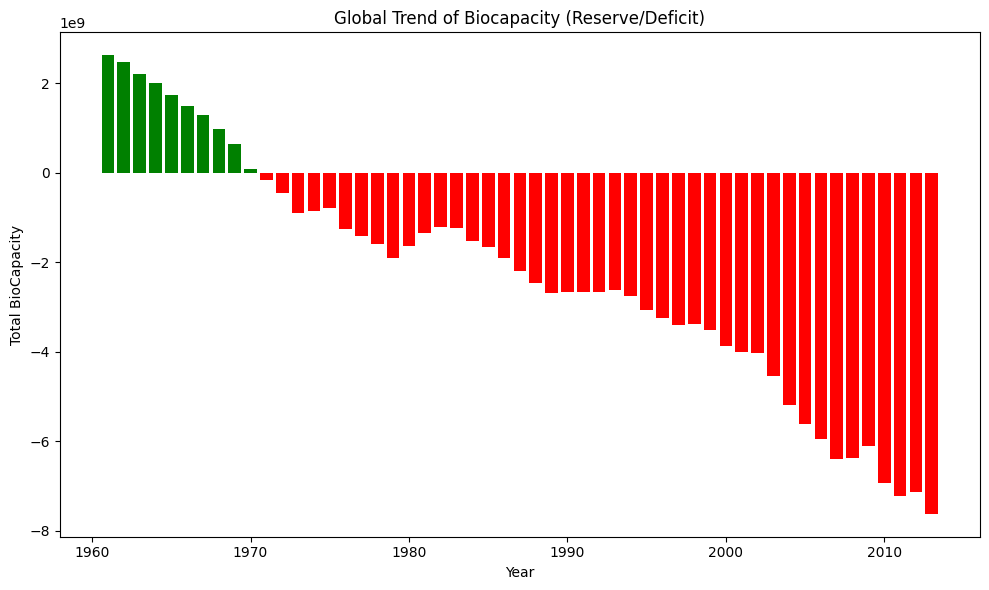

In [21]:
total_biocapacity_by_year = df_biocap_class.groupby('Year')['BioCapacity'].sum()

total_biocapacity_class = total_biocapacity_by_year.apply(lambda x: 'Reserve' if x > 0 else 'Deficit')

df_total_biocap_class = pd.DataFrame({
    'Year': total_biocapacity_by_year.index,
    'Total BioCapacity': total_biocapacity_by_year.values,
    'Classification': total_biocapacity_class.values
})

fig, ax = plt.subplots(figsize=(10, 6))
colors = ['green' if val == 'Reserve' else 'red' for val in df_total_biocap_class['Classification']]
ax.bar(df_total_biocap_class['Year'], df_total_biocap_class['Total BioCapacity'], color=colors)

ax.set_xlabel('Year')
ax.set_ylabel('Total BioCapacity')
ax.set_title('Global Trend of Biocapacity (Reserve/Deficit)')

plt.tight_layout()
plt.show()

### Analyzing Biocapacity Trends for Selected Countries

#### Selection of Countries:
The code begins by specifying a list of countries to include in the analysis. These countries have been carefully selected based on their ranking in terms of maximum carbon and land emissions. This approach ensures the inclusion of nations with significant ecological footprints and varying levels of resource utilization. Notable countries in the list include China, the United States of America, India, and others, representing a diverse set of nations with substantial environmental impacts.

#### Data Filtering:
Using the list of selected countries, the code filters the DataFrame to include only data corresponding to these countries. This step ensures that the subsequent analysis focuses exclusively on the selected nations.

#### Grouping by Country:
The filtered data is then grouped by country, enabling separate analysis for each selected nation. This grouping facilitates a comparative examination of biocapacity trends across different countries over time.

#### Visualizing Biocapacity Trends:
For each country, the code generates a separate bar chart illustrating the trend of biocapacity, classified as Reserve or Deficit, over the years. These visualizations provide insights into the ecological sustainability of resource utilization practices in each country.

#### Interpretation:
By analyzing biocapacity trends for selected countries, we gain valuable insights into the varying degrees of ecological sustainability across nations. These visualizations prompt reflection on the need for concerted efforts towards responsible resource management and conservation to ensure a sustainable future for all.

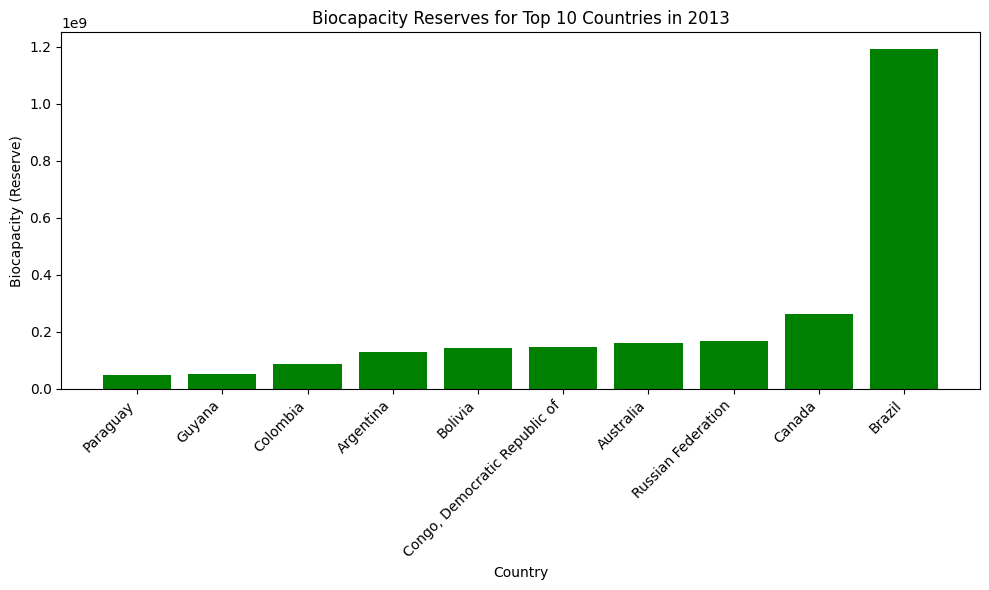

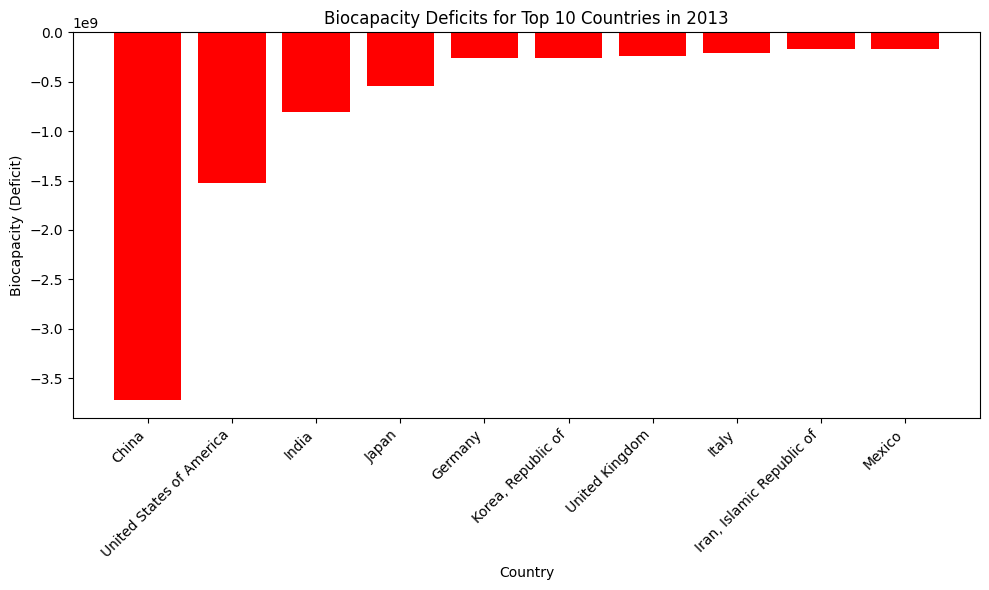

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

df_2013 = df_biocap_class[df_biocap_class['Year'] == 2013]

df_sorted_2013 = df_2013.sort_values(by='BioCapacity')

top_10_reserves_2013 = df_sorted_2013[df_sorted_2013['BioCapacity'] > 0].tail(10)

top_10_deficits_2013 = df_sorted_2013[df_sorted_2013['BioCapacity'] < 0].head(10)

plt.figure(figsize=(10, 6))
plt.bar(top_10_reserves_2013['Country'], top_10_reserves_2013['BioCapacity'], color='green')
plt.xlabel('Country')
plt.ylabel('Biocapacity (Reserve)')
plt.title('Biocapacity Reserves for Top 10 Countries in 2013')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.bar(top_10_deficits_2013['Country'], top_10_deficits_2013['BioCapacity'], color='red')
plt.xlabel('Country')
plt.ylabel('Biocapacity (Deficit)')
plt.title('Biocapacity Deficits for Top 10 Countries in 2013')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

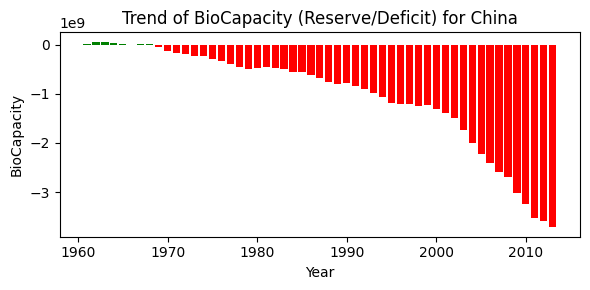

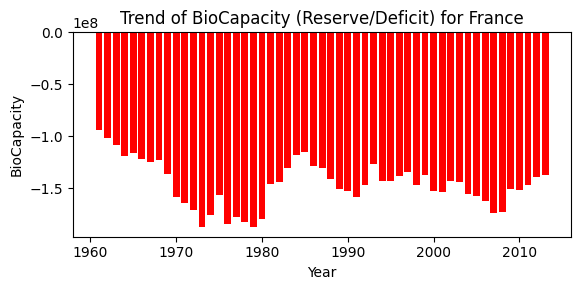

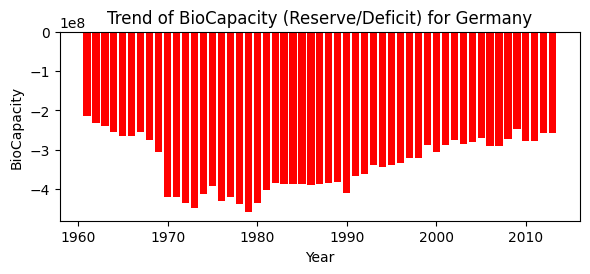

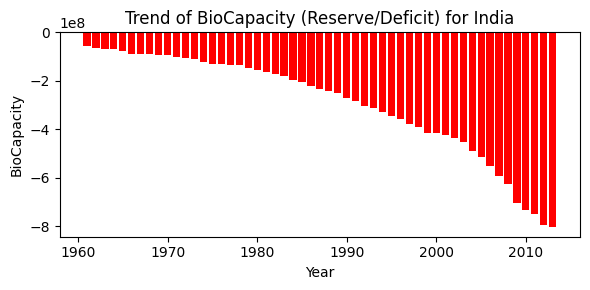

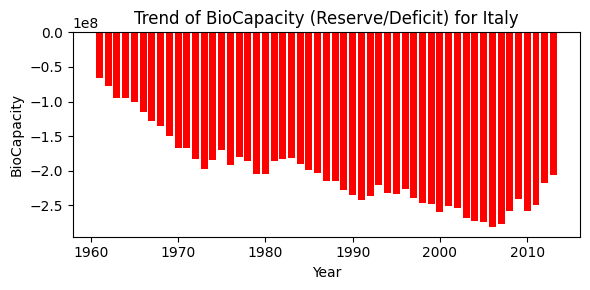

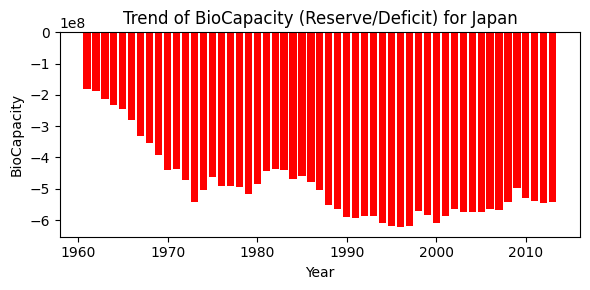

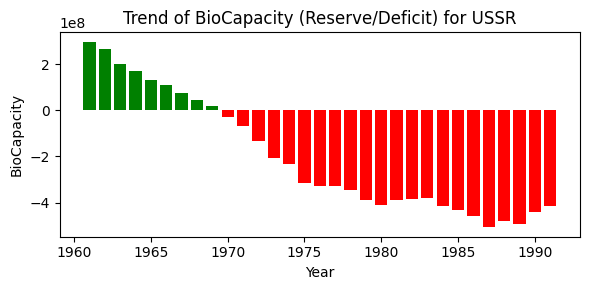

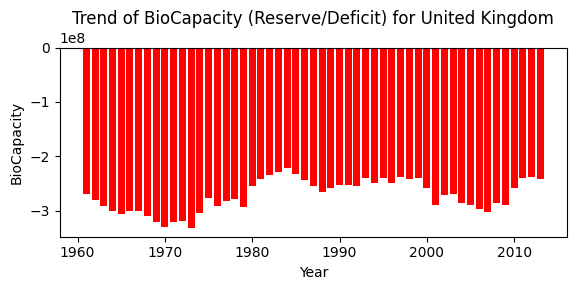

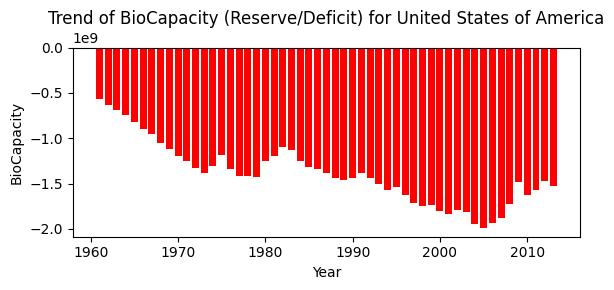

In [23]:
countries = ['China', 'United States of America', 'India', 'USSR', 'Japan', 'Germany', 'United Kingdom', 'France', 'Italy']

df_filtered = df_biocap_class[df_biocap_class['Country'].isin(countries)]

grouped_by_country = df_filtered.groupby('Country')

for country, data in grouped_by_country:
    fig, ax = plt.subplots(figsize=(6, 3))
    
    colors = ['green' if val == 'Reserve' else 'red' for val in data['Classification']]
    ax.bar(data['Year'], data['BioCapacity'], color=colors)
    
    ax.set_xlabel('Year')
    ax.set_ylabel('BioCapacity')
    ax.set_title(f'Trend of BioCapacity (Reserve/Deficit) for {country}')
    
    plt.tight_layout()
    plt.show()

#### Inference: It’s evident that the majority of major emission contributors have seen a consistent rise in their emissions over time. Furthermore, these countries have persistently operated in an ecological deficit. However, a noteworthy exception is Germany, which has demonstrated significant progress in reducing its ecological deficit. This highlights the potential for effective environmental strategies and offers a beacon of hope for other nations striving to achieve similar progress.

#### Next Steps..
Now that our exploratory data analysis is complete, we're ready for the **clustering phase**. 

Clustering allows us to group similar data points together, revealing hidden patterns. This will help us understand global emission trends better, identify major contributors, and pinpoint factors driving emissions. 

By clustering countries based on various features, we can uncover insights **to inform targeted emission reduction strategies**.

##### We'll start by creating a dictionary where each key-value pair consists of a country code and its corresponding country name. This will provide us with a convenient reference to match country codes with their respective names throughout our analysis.

In [18]:
country_code_mapping = df[['country_code', 'country']].drop_duplicates().set_index('country_code')['country'].to_dict()

To streamline our analysis, we'll redefine the land_columns and carbon_column to ensure they're accurately used in the aggregation process.

Here are the 3 steps for grouping them:

**Step 1:** Filter out rows where the record is not one of the specified types

**Step 2:** Group the DataFrame by country and year and perform the specified aggregations

**Step 3:** Define the aggregation for each group

Finally apply the aggregation function to each group

In [19]:
land_columns = ['crop_land', 'grazing_land', 'forest_land', 'fishing_ground', 'built_up_land']
carbon_column = 'carbon'
filtered_df = df[df['record'].isin(['EFConsPerCap', 'EFExportsPerCap', 'EFImportsPerCap', 'EFProdPerCap'])]
grouped = filtered_df.groupby(['country', 'year'])

def aggregate_data(group):
    results = {
        'total_land_use_EFProdExportsImports': 0,
        'total_carbon_EFProdExportsImports': 0,
        'total_land_use_EFCons': 0,
        'total_carbon_EFCons': 0
    }

    # Filter subgroups for each record type and calculate sums
    cons_exports_imports = group[group['record'].isin(['EFProdPerCap', 'EFExportsPerCap', 'EFImportsPerCap'])]
    if not cons_exports_imports.empty:
        results['total_land_use_EFProdExportsImports'] = cons_exports_imports[land_columns].sum().sum()
        results['total_carbon_EFProdExportsImports'] = cons_exports_imports[carbon_column].sum()
    
    prod = group[group['record'] == 'EFConsPerCap']
    if not prod.empty:
        results['total_land_use_EFCons'] = prod[land_columns].sum().sum()
        results['total_carbon_EFCons'] = prod[carbon_column].sum()

    return pd.Series(results)


final_grouped_df = grouped.apply(aggregate_data).reset_index()


As above is focused on the group caculation towards Per capital, then we can set our focus on total

In [20]:
filtered_df_2 = df[df['record'].isin(['EFConsTotGHA', 'EFExportsTotGHA', 'EFExportsTotGHA', 'EFProdTotGHA'])]
grouped_2 = filtered_df_2.groupby(['country', 'year'])
def aggregate_data_total(group):
    results = {
        'total_land_use_EFProdExportsImports': 0,
        'total_carbon_EFProdExportsImports': 0,
        'total_land_use_EFCons': 0,
        'total_carbon_EFCons': 0
    }
    cons_exports_imports = group[group['record'].isin(['EFExportsTotGHA', 'EFExportsTotGHA', 'EFProdTotGHA'])]
    if not cons_exports_imports.empty:
        results['total_land_use_EFProdExportsImports'] = cons_exports_imports[land_columns].sum().sum()
        results['total_carbon_EFProdExportsImports'] = cons_exports_imports[carbon_column].sum()
    
    prod = group[group['record'] == 'EFConsTotGHA']
    if not prod.empty:
        results['total_land_use_EFCons'] = prod[land_columns].sum().sum()
        results['total_carbon_EFCons'] = prod[carbon_column].sum()

    return pd.Series(results)
final_grouped_df_total = grouped_2.apply(aggregate_data_total).reset_index()

### Cluster

#### Find the the best number of clusters using elbow method
We perform clustering analysis on a dataset filtered for a specific year, 1992. Our focus is on land use data related to production, exports, and imports. The key steps in our code include filtering the data for our chosen year, preparing it for clustering, using the Elbow method to determine the optimal number of clusters, and plotting the inertia values to visualize this determination

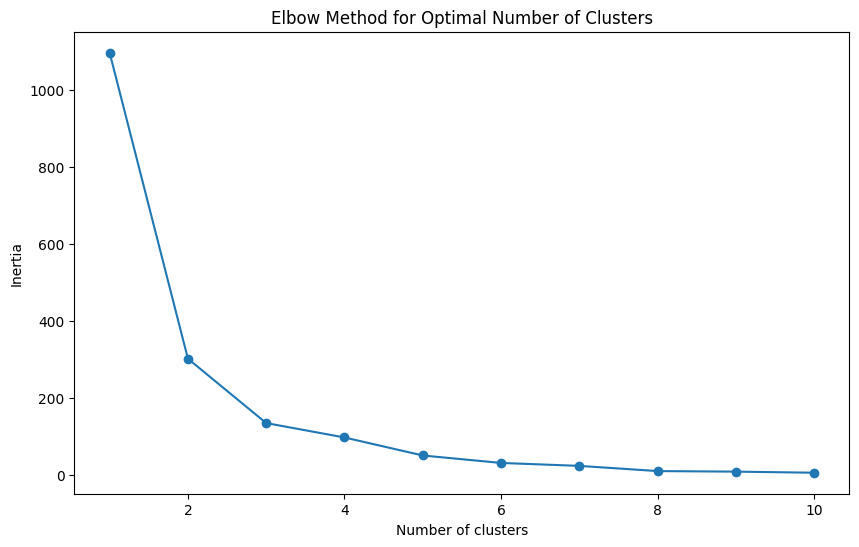

In [21]:
year_selected = 1992

data_for_year = final_grouped_df[final_grouped_df['year'] == year_selected][['country', 'total_land_use_EFProdExportsImports']]

X = data_for_year['total_land_use_EFProdExportsImports'].values.reshape(-1, 1)

inertia = []
for n in range(1, 11):
    kmeans = KMeans(n_clusters=n, random_state=0).fit(X)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()


#### Inference: From the graph above, we notice that when there comes to 3 clusters, the rate of decrease is noticeably slows down, which is the "Elbow Point"

### group data by years

In [22]:
yearly_data = {}

for year in final_grouped_df['year'].unique():
    data_for_year = final_grouped_df[final_grouped_df['year'] == year][['country', 'total_land_use_EFProdExportsImports', 'total_carbon_EFProdExportsImports','total_land_use_EFCons','total_carbon_EFCons']]
    yearly_data[year] = data_for_year

In this section of our code, we perform clustering analysis on yearly data related to land use for production, exports, and imports. We use the KMeans algorithm to group countries into clusters based on 4 patterns, and then visually represent these clusters in a series of plots. This allows us to track and analyze trends over time, aiding in our understanding of environmental impacts.
next we are going to do the cluster based on the 4 parameters

#### 1. total_land_use_EFProdExportsImports

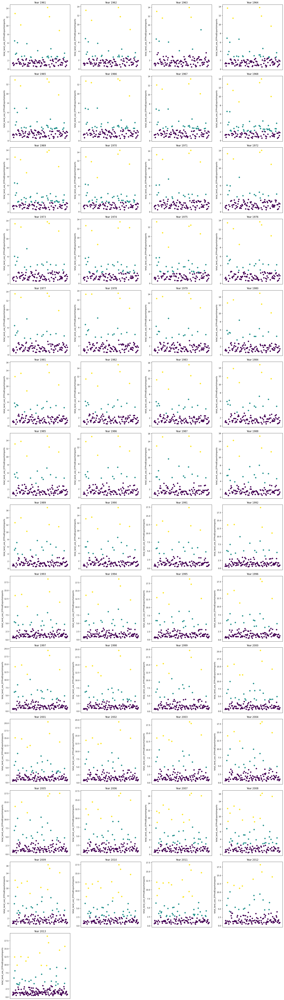

In [23]:
country_dict = {}

n_years = len(yearly_data)
n_cols = 4  
n_rows = math.ceil(n_years / n_cols)  

fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axs = axs.flatten()

for i, (year, data) in enumerate(yearly_data.items()):
    X = data['total_land_use_EFProdExportsImports'].values.reshape(-1, 1)
    kmeans = KMeans(n_clusters=3, random_state=0).fit(X)
    data['cluster'] = kmeans.labels_
    
    order = data['cluster'].value_counts().index
    
    size_rank = {old_label: new_label for new_label, old_label in enumerate(order, 1)}
    data['size_rank'] = data['cluster'].map(size_rank)

    axs[i].scatter(np.arange(len(data)), data['total_land_use_EFProdExportsImports'], c=data['size_rank'], cmap='viridis')
    axs[i].set_title(f'Year {year}')
    axs[i].set_ylabel('total_land_use_EFProdExportsImports')
    axs[i].set_xticks([])

    country_dict[year] = {}
    for rank in data['size_rank'].unique():
        countries = data[data['size_rank'] == rank]['country'].to_list()
        country_dict[year][rank] = set(countries)

for ax in axs[i + 1:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

cluster_values_total_land_use_EFProdExportsImports = {1: [], 2: [], 3: []}
for year, data in yearly_data.items():
    for rank in range(1, 4):  # cluster rank is 1, 2, 3
        average_value_total_land_use_EFProdExportsImports = data[data['size_rank'] == rank]['total_land_use_EFProdExportsImports'].mean()
        cluster_values_total_land_use_EFProdExportsImports[rank].append(average_value_total_land_use_EFProdExportsImports)




#### Observation: Based on the clusters for total_land_use_EFProdExportsImports, as time approaches, more and more countries have reached the first cluster, which means that more and more countries have produced more carbon as their growing developemnt of industries.

#### 2. total_carbon_EFProdExportsImports

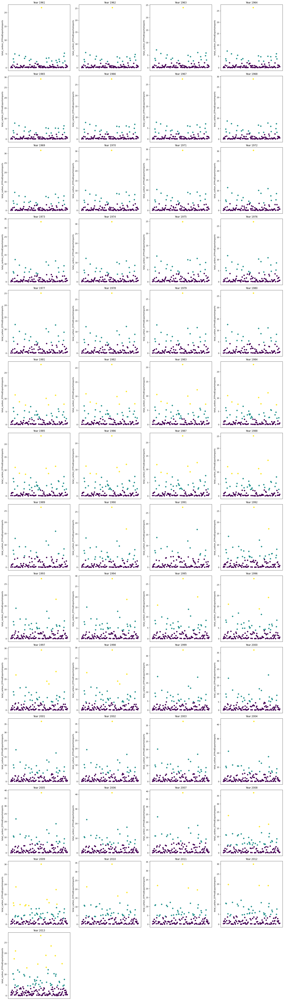

In [24]:
country_dict = {}

n_years = len(yearly_data)
n_cols = 4
n_rows = math.ceil(n_years / n_cols)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axs = axs.flatten()

for i, (year, data) in enumerate(yearly_data.items()):
    X = data['total_carbon_EFProdExportsImports'].values.reshape(-1, 1)
    kmeans = KMeans(n_clusters=3, random_state=0).fit(X)
    data['cluster'] = kmeans.labels_
    
    order = data['cluster'].value_counts().index
    
    size_rank = {old_label: new_label for new_label, old_label in enumerate(order, 1)}
    data['size_rank'] = data['cluster'].map(size_rank)

    axs[i].scatter(np.arange(len(data)), data['total_carbon_EFProdExportsImports'], c=data['size_rank'], cmap='viridis')
    axs[i].set_title(f'Year {year}')
    axs[i].set_ylabel('total_carbon_EFProdExportsImports')
    axs[i].set_xticks([]) 

    country_dict[year] = {}
    for rank in data['size_rank'].unique():
        countries = data[data['size_rank'] == rank]['country'].to_list()
        country_dict[year][rank] = set(countries)

for ax in axs[i + 1:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

cluster_values_total_carbon_EFProdExportsImports = {1: [], 2: [], 3: []}
for year, data in yearly_data.items():
    for rank in range(1, 4):  # cluster rank is 1, 2, 3
        average_value_total_carbon_EFProdExportsImports = data[data['size_rank'] == rank]['total_carbon_EFProdExportsImports'].mean()
        cluster_values_total_carbon_EFProdExportsImports[rank].append(average_value_total_carbon_EFProdExportsImports)




#### Observation: Based on the clusters for total_carbon_use_EFProdExportsImports, as time approaches, in general vision, the output is growing from most of countries stays at low level to moving to a medium level.

In [25]:
filtered_df = final_grouped_df[(final_grouped_df['year'] >= 2000) & (final_grouped_df['year'] <= 2013)]

percap_land_use_EFProdExportsImports = filtered_df.groupby('country')['total_land_use_EFProdExportsImports'].sum().nlargest(6).index.tolist()
percap_carbon_EFProdExportsImports = filtered_df.groupby('country')['total_carbon_EFProdExportsImports'].sum().nlargest(6).index.tolist()
percap_land_use_EFCons = filtered_df.groupby('country')['total_land_use_EFCons'].sum().nlargest(6).index.tolist()
percap_carbon_EFCons = filtered_df.groupby('country')['total_carbon_EFCons'].sum().nlargest(6).index.tolist()


In [26]:
filtered_df_total = final_grouped_df_total[(final_grouped_df_total['year'] >= 2000) & (final_grouped_df_total['year'] <= 2013)]

sum_land_use_EFProdExportsImports = filtered_df_total.groupby('country')['total_land_use_EFProdExportsImports'].sum().nlargest(6).index.tolist()
sum_carbon_EFProdExportsImports = filtered_df_total.groupby('country')['total_carbon_EFProdExportsImports'].sum().nlargest(6).index.tolist()
sum_land_use_EFCons = filtered_df_total.groupby('country')['total_land_use_EFCons'].sum().nlargest(6).index.tolist()
sum_carbon_EFCons = filtered_df_total.groupby('country')['total_carbon_EFCons'].sum().nlargest(6).index.tolist()


#### 3. total_land_use_EFCons

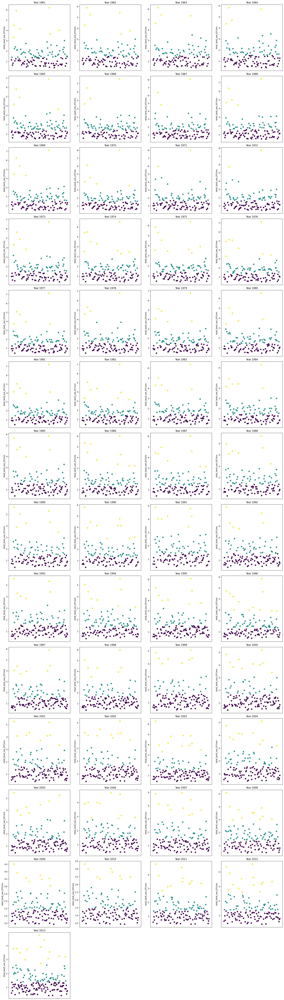

In [27]:
country_dict = {}

n_years = len(yearly_data)
n_cols = 4 
n_rows = math.ceil(n_years / n_cols)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axs = axs.flatten()

for i, (year, data) in enumerate(yearly_data.items()):
    X = data['total_land_use_EFCons'].values.reshape(-1, 1)
    kmeans = KMeans(n_clusters=3, random_state=0).fit(X)
    data['cluster'] = kmeans.labels_
    
    order = data['cluster'].value_counts().index
    
    size_rank = {old_label: new_label for new_label, old_label in enumerate(order, 1)}
    data['size_rank'] = data['cluster'].map(size_rank)

    axs[i].scatter(np.arange(len(data)), data['total_land_use_EFCons'], c=data['size_rank'], cmap='viridis')
    axs[i].set_title(f'Year {year}')
    axs[i].set_ylabel('total_land_use_EFCons')
    axs[i].set_xticks([])

    country_dict[year] = {}
    for rank in data['size_rank'].unique():
        countries = data[data['size_rank'] == rank]['country'].to_list()
        country_dict[year][rank] = set(countries)

for ax in axs[i + 1:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

cluster_values_total_land_use_EFCons = {1: [], 2: [], 3: []}
for year, data in yearly_data.items():
    for rank in range(1, 4): 
        average_value_total_land_use_EFCons = data[data['size_rank'] == rank]['total_land_use_EFCons'].mean()
        cluster_values_total_land_use_EFCons[rank].append(average_value_total_land_use_EFCons)




#### 4. total_carbon_EFCons

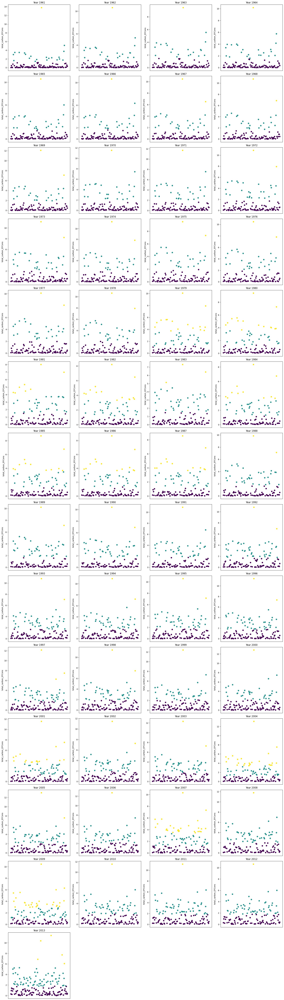

In [28]:
country_dict = {}

n_years = len(yearly_data)
n_cols = 4 
n_rows = math.ceil(n_years / n_cols) 

fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axs = axs.flatten()

for i, (year, data) in enumerate(yearly_data.items()):
    X = data['total_carbon_EFCons'].values.reshape(-1, 1)
    kmeans = KMeans(n_clusters=3, random_state=0).fit(X)
    data['cluster'] = kmeans.labels_
    
    order = data['cluster'].value_counts().index
    
    size_rank = {old_label: new_label for new_label, old_label in enumerate(order, 1)}
    data['size_rank'] = data['cluster'].map(size_rank)

    axs[i].scatter(np.arange(len(data)), data['total_carbon_EFCons'], c=data['size_rank'], cmap='viridis')
    axs[i].set_title(f'Year {year}')
    axs[i].set_ylabel('total_carbon_EFCons')
    axs[i].set_xticks([])

    country_dict[year] = {}
    for rank in data['size_rank'].unique():
        countries = data[data['size_rank'] == rank]['country'].to_list()
        country_dict[year][rank] = set(countries)

for ax in axs[i + 1:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

cluster_values_total_carbon_EFCons = {1: [], 2: [], 3: []}
for year, data in yearly_data.items():
    for rank in range(1, 4):
        average_value_total_carbon_EFCons = data[data['size_rank'] == rank]['total_carbon_EFCons'].mean()
        cluster_values_total_carbon_EFCons[rank].append(average_value_total_carbon_EFCons)




#### then we plot the trend of the clusters from 1961 to 2013, in order to find some potential links

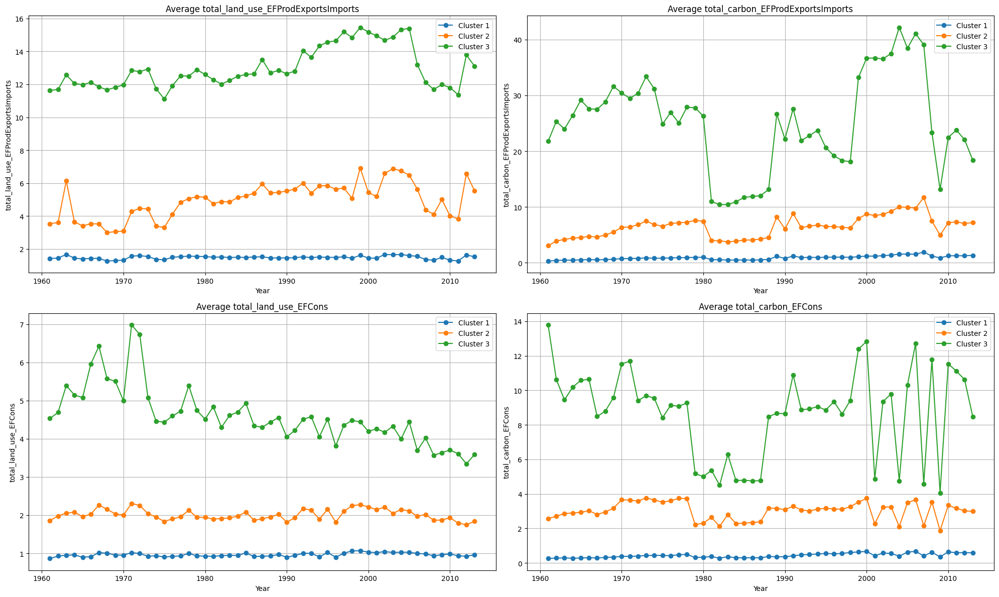

In [29]:
all_cluster_values = {
    'Average total_land_use_EFProdExportsImports': cluster_values_total_land_use_EFProdExportsImports,
    'Average total_carbon_EFProdExportsImports': cluster_values_total_carbon_EFProdExportsImports,
    'Average total_land_use_EFCons': cluster_values_total_land_use_EFCons,
    'Average total_carbon_EFCons': cluster_values_total_carbon_EFCons
}

fig, axs = plt.subplots(2, 2, figsize=(20, 12))
axs = axs.flatten()

years = list(yearly_data.keys())

for i, (title, cluster_values) in enumerate(all_cluster_values.items()):
    for rank in range(1, 4):
        axs[i].plot(years, cluster_values[rank], marker='o', label=f'Cluster {rank}')
        axs[i].set_title(title)
        axs[i].set_xlabel('Year')
        axs[i].set_ylabel(title.split(' ')[1])
        axs[i].legend()
        axs[i].grid(True)

plt.tight_layout()
plt.show()

The land use for Production, Exports, and Imports (ProdExportsImports) has been generally increasing over time for Cluster 1, with noticeable stability or a slight increase for Clusters 2 and 3.

Conversely, land use for Consumption (EFCons) shows a decreasing trend, particularly within Cluster 1, suggesting a more efficient or reduced use of land over time in this cluster.

Looking at carbon emissions associated with Production, Exports, and Imports, there is an increasing trend for Cluster 1, while Clusters 2 and 3 display a more stable but low level of emissions over the years.

Carbon emissions for Consumption also demonstrate an increasing pattern for Cluster 1, with significant fluctuations. Clusters 2 and 3 show comparatively lower levels of carbon emissions with some variability.

These trends could be indicative of changes in land management practices, economic activities, and environmental policies within the respective clusters. Cluster 1, in particular, may be experiencing growth in production and export activities, which could explain both the increase in land use and carbon emissions. The reduction in land use for consumption in Cluster 1 might reflect advancements in land-use efficiency or shifts in the types of land use that are included in this category.

#### Based on the cluster, we find out the 5 countries that have the most land use PEI(Production,Import,Export)

In [30]:
sum_land_use_EFProdExportsImports

['World', 'China', 'United States of America', 'Brazil', 'India', 'Canada']

### Inference: we find out the 5 countries are 'China', 'United States of America', 'Brazil', 'India', 'Canada'. 

#### Then we are going to predict the total ecological footprint of these 3 countries 'USA','China','India' in the next 5 years 

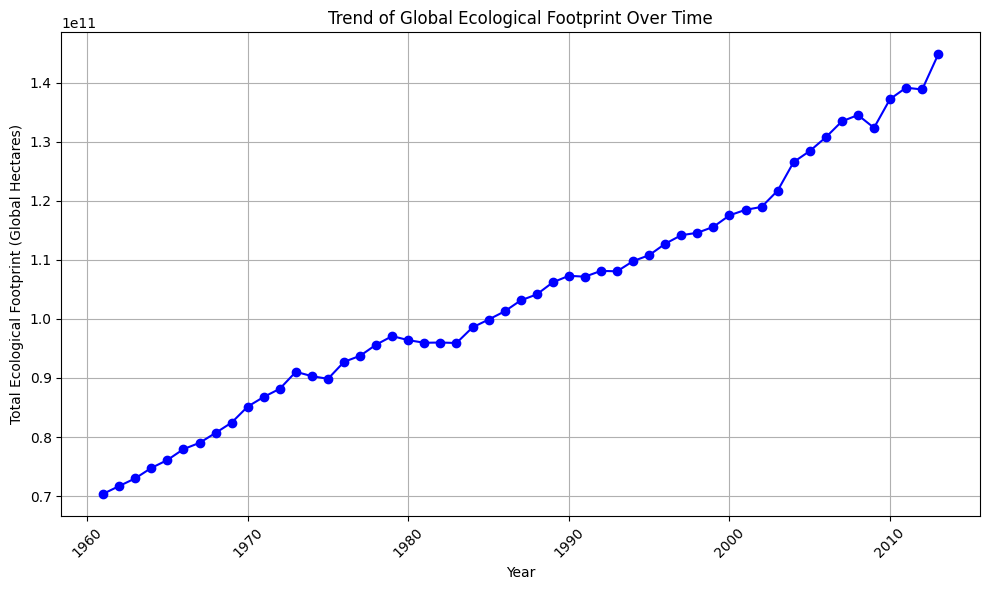

In [31]:
global_eco_footprint = df[df['record'].str.contains("Tot", case=False)].groupby('year')['total'].sum().reset_index()

# Step 3: Plot the trend of global ecological footprint over time
plt.figure(figsize=(10, 6))
plt.plot(global_eco_footprint['year'], global_eco_footprint['total'], marker='o', linestyle='-', color='b')
plt.title('Trend of Global Ecological Footprint Over Time')
plt.xlabel('Year')
plt.ylabel('Total Ecological Footprint (Global Hectares)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to make room for the rotated x-axis labels

plt.show()

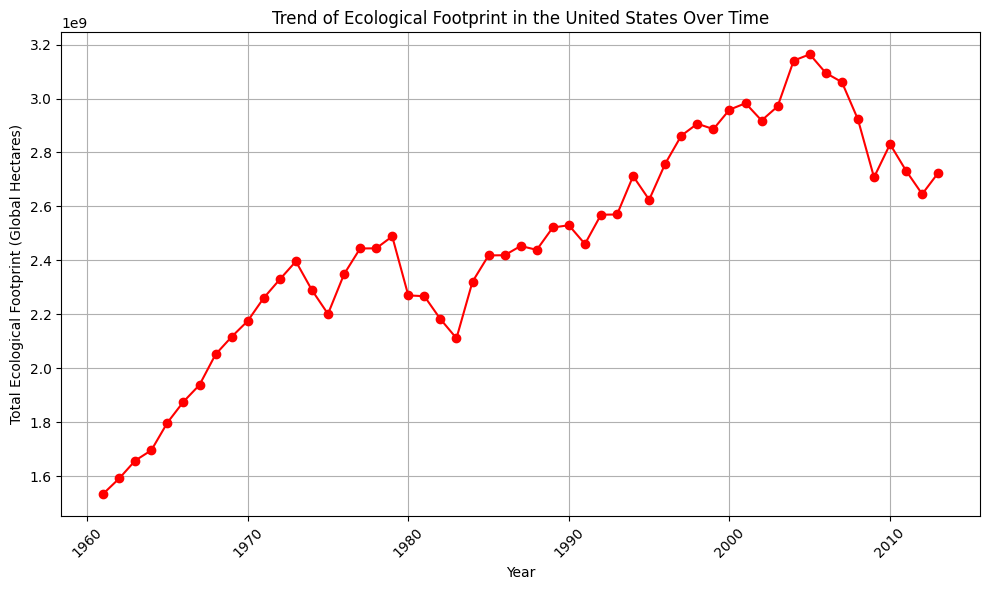

In [32]:
# Filter the dataset for records related to the United States and for total ecological footprint records
us_eco_footprint = df[
    (df['country'] == 'United States of America') & 
    df['record'].str.contains("EFConsTotGHA", case=False)
].groupby('year')['total'].sum().reset_index()

# Plotting the trend
plt.figure(figsize=(10, 6))
plt.plot(us_eco_footprint['year'], us_eco_footprint['total'], marker='o', linestyle='-', color='r')
plt.title('Trend of Ecological Footprint in the United States Over Time')
plt.xlabel('Year')
plt.ylabel('Total Ecological Footprint (Global Hectares)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


#### The index we are to use is focused on Carbon, we predict the next 5 years value of US,China,India

## US

In [33]:
us_data = df[(df['country'] == 'United States of America') & df['record'].str.contains('EFConsTotGHA')]

# Ensure the time series is sorted by year
us_data = us_data.sort_values('year')

In [34]:
from statsmodels.tsa.stattools import adfuller

In [35]:
carbon_data = us_data[['year', 'carbon']].set_index('year')

carbon_data.dropna(inplace=True)


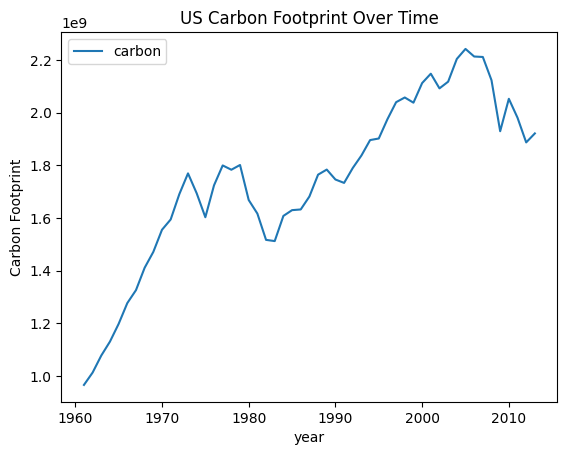

In [36]:
import matplotlib.pyplot as plt

carbon_data.plot(title='US Carbon Footprint Over Time')
plt.ylabel('Carbon Footprint')
plt.show()


**ARIMA model**

We use Autoregressive models to check if past values of a variable have a linear influence on its future values.
In AR models, this autocorrelation is explicitly leveraged to forecast future values. The model assumes that there's a linear relationship between an observation and a number of lagged observations (its own previous values). The strength and sign of this relationship are captured by the model's coefficients, which are estimated from the data.


**what is stationary time series and why do we need it?**
A stationary time series is one whose statistical properties such as mean, variance, and autocorrelation are constant over time. This concept is crucial in the context of time series analysis and forecasting because many statistical models rely on the assumption of stationarity. There are two main types of stationarity:

Strict Stationarity: A time series is strictly stationary if the joint distribution of any moments of the series (e.g., mean, variance) is the same, regardless of the time at which the series is observed. This means that the statistical properties of the series do not change over time.

Weak Stationarity: A time series is weakly stationary (or simply stationary in many contexts) if its mean, variance, and autocovariance are invariant over time. Weak stationarity is a less strict condition than strict stationarity and is the form most often referred to in time series analysis.

**Why Do We Need Stationarity?**
Modeling Simplicity: Stationary data is easier to model. Many time series forecasting methods assume stationarity because it implies that the future statistical properties of the series can be estimated as the same as those currently observed. This simplifies both the model and its mathematical representation.

Before applying ARIMA, check if your series is stationary using statistical tests like the Augmented Dickey-Fuller (ADF) test.

The fundamental idea behind the ADF test is to check whether a time series is non-stationary because of a unit root. 

In [37]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(carbon_data['carbon'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])


ADF Statistic: -2.792539
p-value: 0.059347


**ADF Statistic:** The more negative the statistic, the stronger the rejection of the null hypothesis (that the series has a unit root or is non-stationary).

**p-value:** This indicates the probability of observing the test statistic if the null hypothesis is true. A common threshold for rejecting the null hypothesis is a p-value less than 0.05. 

This means the time series is marginally non-stationary at the 5% significance level but might be considered stationary at the 10% level.



**Differencing the Series:** To strengthen the stationarity for ARIMA modeling, we difference the series once and perform the ADF test again. Differencing often helps in making a series stationary.

In [38]:
# Differencing the series
carbon_data_diff = carbon_data['carbon'].diff().dropna()

# Perform ADF test again on the differenced series
result_diff = adfuller(carbon_data_diff)
print('ADF Statistic (Differenced):', result_diff[0])
print('p-value (Differenced):', result_diff[1])


ADF Statistic (Differenced): -5.725406964435583
p-value (Differenced): 6.789455350273768e-07


**ADF Statistic:** The value of -5.7254 is much more negative than the typical critical values for the ADF test, strongly suggesting the rejection of the null hypothesis that the series has a unit root (i.e., is non-stationary).

**p-value:** The extremely low p-value (significantly less than 0.05) provides strong evidence against the null hypothesis, indicating that the differenced series is stationary.

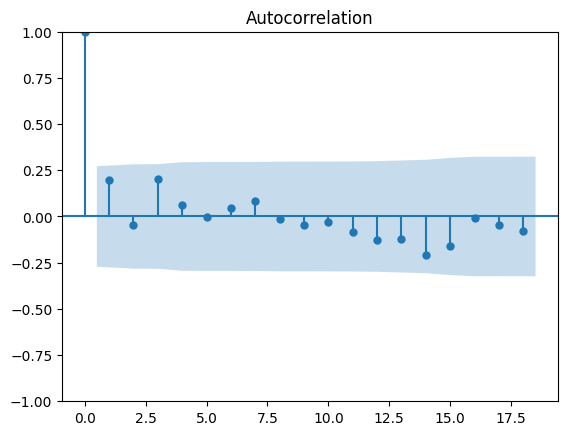

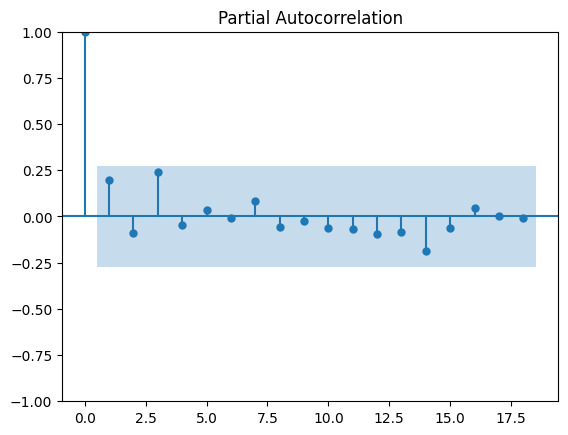

In [39]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Assuming carbon_data_diff is your differenced series
plot_acf(carbon_data_diff)
plt.show()

plot_pacf(carbon_data_diff)
plt.show()

For **p(Autoregressive term):** We need to look at the PACF plot to determine the point at which the plot crosses the significance threshold for the first time. This lag is a good choice for p. This value helps in learning from past mistakes by learning from its own lags.

For **q(Moving Average term):** we need to look at the ACF plot for a similar determination. The first significant lag after which most other lags are insignificant is a good choice for q. 

In [40]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

carbon_data_standardized = scaler.fit_transform(carbon_data[['carbon']])
carbon_data['carbon_standardized'] = carbon_data_standardized

# Now, you can model 'carbon_standardized' instead of 'carbon'


In [41]:
from statsmodels.tsa.arima.model import ARIMA

# Fit the ARIMA model
model = ARIMA(carbon_data['carbon_standardized'], order=(1, 1, 1))
model_fit = model.fit()

# Print out the summary of the model
print(model_fit.summary())





                                SARIMAX Results                                
Dep. Variable:     carbon_standardized   No. Observations:                   53
Model:                  ARIMA(1, 1, 1)   Log Likelihood                   7.206
Date:                 Mon, 22 Apr 2024   AIC                             -8.411
Time:                         17:01:41   BIC                             -2.558
Sample:                              0   HQIC                            -6.167
                                  - 53                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5049      0.319     -1.581      0.114      -1.131       0.121
ma.L1          0.7985      0.289      2.762      0.006       0.232       1.365
sigma2         0.0441      0.009      4.789 

/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


#### Understanding the results:
**Log Likelihood:7.206**
This is a measure of the fit of the model. A higher log likelihood indicates a better fit to the data.

**ar.L1:** 
The coefficient for the autoregressive term (lag 1). The value of -0.5049 suggests a negative relationship between the current value and its previous value.

**ma.L1:**
The coefficient for the moving average term (lag 1). The value of 0.7985 indicates that the model uses the previous error (the difference between the previous observation and the previous forecast) to adjust the current forecast.
For AR: since P>z e cannot reject the null hypothesis.the confidence interval ranges from -1.131 to 0.121. Since this interval includes zero, it's consistent with the p-value and suggests that we are not confident the true AR effect is different from zero.

**MA(moving average):**
We would reject the null hypothesis at the 5% level. the confidence interval ranges from 0.232 to 1.365, which does not include zero. This reinforces the finding from the p-value that the MA coefficient is significantly different from zero.

#### In summary, the MA part of the model has a significant effect, suggesting that incorporating the previous error into the current forecast improves the model. The AR part, however, is not statistically significant, indicating that the past value of the series is not a strong predictor of the current value

So we remove it and check focusing on just MA gives us a better model

In [42]:
from statsmodels.tsa.arima.model import ARIMA

# Fit the ARIMA model
model = ARIMA(carbon_data['carbon_standardized'], order=(0, 1, 1))
model_fit = model.fit()

# Print out the summary of the model
print(model_fit.summary())



                                SARIMAX Results                                
Dep. Variable:     carbon_standardized   No. Observations:                   53
Model:                  ARIMA(0, 1, 1)   Log Likelihood                   6.402
Date:                 Mon, 22 Apr 2024   AIC                             -8.805
Time:                         17:01:41   BIC                             -4.902
Sample:                              0   HQIC                            -7.308
                                  - 53                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3248      0.112      2.889      0.004       0.104       0.545
sigma2         0.0457      0.009      4.828      0.000       0.027       0.064
Ljung-Box (L1) (Q):                   0.32  

/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


The log likelihood is higher, indicating a better fit to the data compared to the previous ARIMA(1, 1, 1) model.
AIC, BIC, and HQIC values are lower, which suggests that this model is a more efficient representation of the underlying data, balancing model complexity with fit.

The moving average component is statistically significant, with the MA term indicating that incorporating information from past errors improves the model's predictions.

The diagnostic tests show no autocorrelation in the residuals and no evidence of heteroskedasticity, implying that the residuals are random and evenly spread out, which is desirable in a well-fitted time series model.

The residuals are approximately normally distributed, as indicated by the Jarque-Bera test and values for skewness and kurtosis, which align closely with the properties of a normal distribution.

These aspects combined make the ARIMA(0, 1, 1) model a potentially better choice for forecasting than the ARIMA(1, 1, 1) model for this particular dataset.

The significant MA term suggests that the best predictor of the current level of the standardized carbon emissions is the error made in predicting the carbon level in the previous period. In contrast, the lack of AR terms indicates that the value of the series in the previous period does not provide additional information for the current period's value once the MA term is accounted for

In [43]:
forecast_scaled = model_fit.forecast(steps=5)

forecast_scaled_array = forecast_scaled.to_numpy().reshape(-1, 1)
forecast = scaler.inverse_transform(forecast_scaled_array.reshape(-1, 1))

print(forecast)

[[1.93783663e+09]
 [1.93783663e+09]
 [1.93783663e+09]
 [1.93783663e+09]
 [1.93783663e+09]]


/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


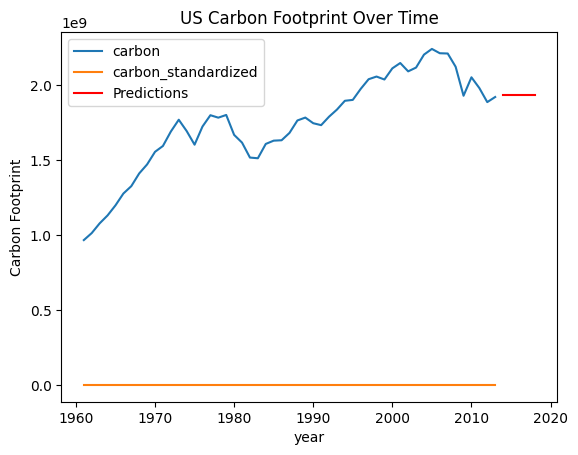

In [44]:
carbon_data.plot(title='US Carbon Footprint Over Time')
years_predictions = [2014, 2015, 2016, 2017, 2018]
predictions = [i[0] for i in forecast]

plt.plot(years_predictions, predictions, color='red', label='Predictions')

plt.ylabel('Carbon Footprint')
plt.legend()
plt.show()

### CHINA

In [45]:
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

In [46]:
china_data = df[(df['country'] == 'China') & df['record'].str.contains('EFConsTotGHA')]

# Ensure the time series is sorted by year
china_data = china_data.sort_values('year')

In [47]:
china_carbon_data = china_data[['year', 'carbon']].set_index('year')

china_carbon_data.dropna(inplace=True)


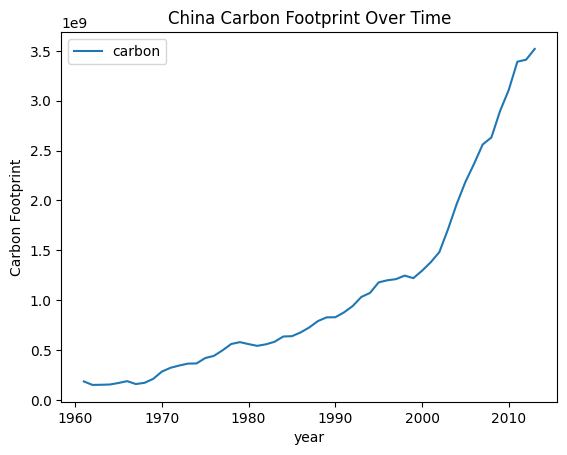

In [48]:


china_carbon_data.plot(title='China Carbon Footprint Over Time')
plt.ylabel('Carbon Footprint')
plt.show()


In [49]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(china_data['carbon'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])


ADF Statistic: 1.975478
p-value: 0.998640


In [50]:
# Differencing the series
china_data_diff = china_data['carbon'].diff().dropna()

# Perform ADF test again on the differenced series
result_diff = adfuller(china_data_diff)
print('ADF Statistic (Differenced):', result_diff[0])
print('p-value (Differenced):', result_diff[1])


ADF Statistic (Differenced): -2.383875033103733
p-value (Differenced): 0.1463393773252839


In [51]:
# Second differencing
china_data_diff2 = china_data_diff.diff().dropna()

# Perform ADF test on the twice-differenced series
result_diff2 = adfuller(china_data_diff2)
print('ADF Statistic (Second Differenced):', result_diff2[0])
print('p-value (Second Differenced):', result_diff2[1])


ADF Statistic (Second Differenced): -5.162719342560682
p-value (Second Differenced): 1.0471069241349832e-05


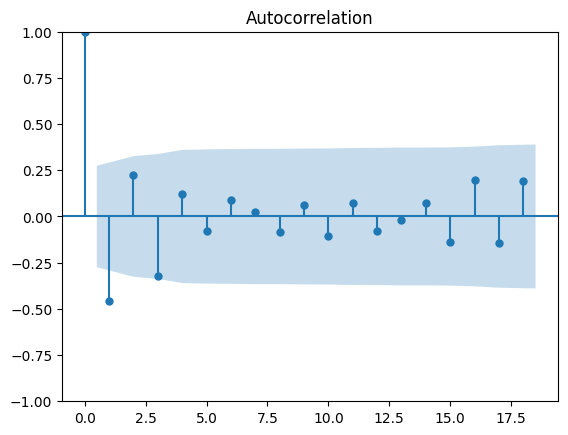

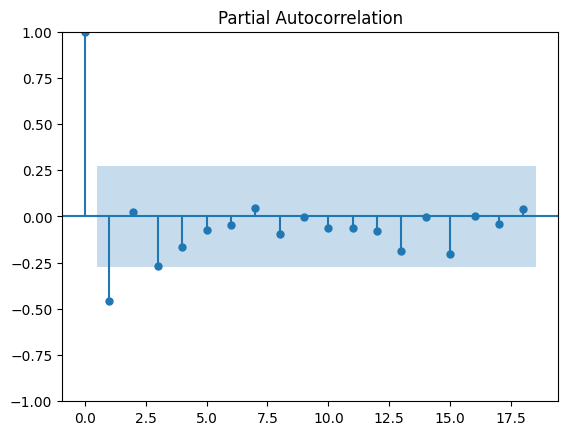

In [52]:
plot_acf(china_data_diff2)
plt.show()

plot_pacf(china_data_diff2)
plt.show()

In [53]:

scaler = StandardScaler()

carbon_data_standardized = scaler.fit_transform(china_data[['carbon']])
china_data['carbon_standardized'] = carbon_data_standardized


In [54]:
from statsmodels.tsa.arima.model import ARIMA


model1 = ARIMA(china_data['carbon_standardized'], order=(1, 2, 1))
model_fit1 = model1.fit()


print(model_fit1.summary())

                                SARIMAX Results                                
Dep. Variable:     carbon_standardized   No. Observations:                   53
Model:                  ARIMA(1, 2, 1)   Log Likelihood                  70.982
Date:                 Mon, 22 Apr 2024   AIC                           -135.964
Time:                         17:01:41   BIC                           -130.168
Sample:                              0   HQIC                          -133.749
                                  - 53                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8694      0.148     -5.868      0.000      -1.160      -0.579
ma.L1          0.5246      0.199      2.630      0.009       0.134       0.916
sigma2         0.0036      0.001      5.183 

/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [55]:
forecast_scaled = model_fit1.forecast(steps=5)

forecast_scaled_array = forecast_scaled.to_numpy().reshape(-1, 1)
forecast = scaler.inverse_transform(forecast_scaled_array.reshape(-1, 1))

print(forecast)

[[3.53302203e+09]
 [3.62906181e+09]
 [3.65320184e+09]
 [3.73984976e+09]
 [3.77215484e+09]]


/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


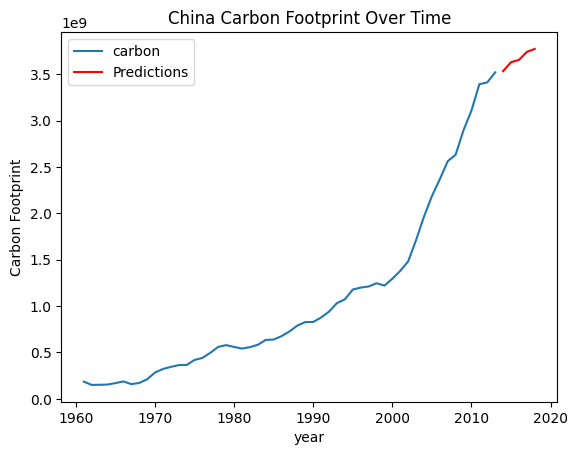

In [56]:
china_carbon_data.plot(title='China Carbon Footprint Over Time')
years_predictions = [2014, 2015, 2016, 2017, 2018]
predictions = [i[0] for i in forecast]

plt.plot(years_predictions, predictions, color='red', label='Predictions')

plt.ylabel('Carbon Footprint')
plt.legend()
plt.show()

## India

In [57]:
india_data = df[(df['country'] == 'India') & df['record'].str.contains('EFConsTotGHA')]

# Ensure the time series is sorted by year
india_data = india_data.sort_values('year')

In [58]:
india_carbon_data = india_data[['year', 'carbon']].set_index('year')

india_carbon_data.dropna(inplace=True)


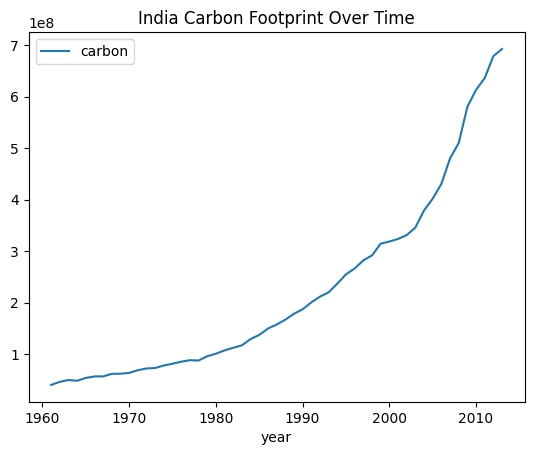

In [59]:
import matplotlib.pyplot as plt

india_carbon_data.plot(title='India Carbon Footprint Over Time')
plt.legend()
plt.show()

In [60]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(india_data['carbon'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])


ADF Statistic: 5.712602
p-value: 1.000000


In [61]:
# Differencing the series
india_data_diff = india_data['carbon'].diff().dropna()

# Perform ADF test again on the differenced series
result_diff = adfuller(india_data_diff)
print('ADF Statistic (Differenced):', result_diff[0])
print('p-value (Differenced):', result_diff[1])


ADF Statistic (Differenced): 2.3488794528256314
p-value (Differenced): 0.9989841840768374


In [62]:
# Second differencing
india_data_diff2 = india_data_diff.diff().dropna()

# Perform ADF test on the twice-differenced series
result_diff2 = adfuller(india_data_diff2)
print('ADF Statistic (Second Differenced):', result_diff2[0])
print('p-value (Second Differenced):', result_diff2[1])


ADF Statistic (Second Differenced): -5.260399799581299
p-value (Second Differenced): 6.6104745219960335e-06


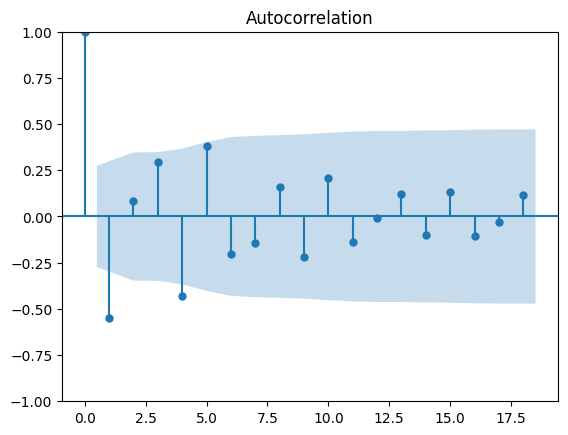

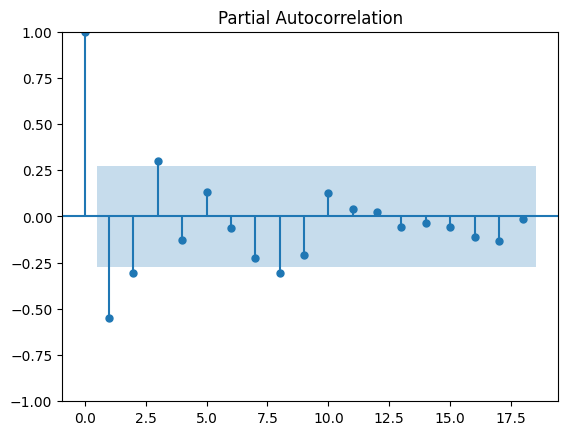

In [63]:
plot_acf(india_data_diff2)
plt.show()

plot_pacf(india_data_diff2)
plt.show()

In [64]:
scaler = StandardScaler()

carbon_data_standardized = scaler.fit_transform(india_data[['carbon']])
india_data['carbon_standardized'] = carbon_data_standardized


In [65]:

model2 = ARIMA(india_data['carbon_standardized'], order=(1, 2, 1))
model_fit2 = model2.fit()


print(model_fit2.summary())





                                SARIMAX Results                                
Dep. Variable:     carbon_standardized   No. Observations:                   53
Model:                  ARIMA(1, 2, 1)   Log Likelihood                  79.709
Date:                 Mon, 22 Apr 2024   AIC                           -153.417
Time:                         17:01:42   BIC                           -147.622
Sample:                              0   HQIC                          -151.203
                                  - 53                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4358      0.086     -5.071      0.000      -0.604      -0.267
ma.L1         -0.3004      0.182     -1.647      0.100      -0.658       0.057
sigma2         0.0025      0.000      7.976 

/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [66]:
forecast_scaled = model_fit2.forecast(steps=5)

forecast_scaled_array = forecast_scaled.to_numpy().reshape(-1, 1)
forecast = scaler.inverse_transform(forecast_scaled_array.reshape(-1, 1))

print(forecast)

[[7.24313133e+08]
 [7.48357728e+08]
 [7.75826462e+08]
 [8.01802897e+08]
 [8.28429702e+08]]


/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/yuhan2zhang/anaconda3/envs/last/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


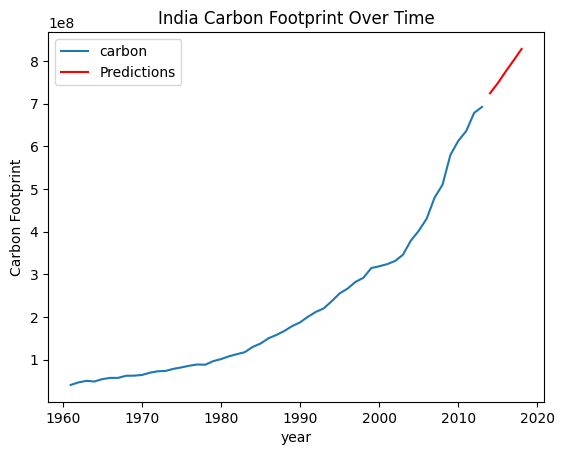

In [67]:
india_carbon_data.plot(title='India Carbon Footprint Over Time')
years_predictions = [2014, 2015, 2016, 2017, 2018]
predictions = [i[0] for i in forecast]

plt.plot(years_predictions, predictions, color='red', label='Predictions')

plt.ylabel('Carbon Footprint')
plt.legend()
plt.show()

#### The index we are to use is focused is forest_land, we predict the next 5 years value of US,China,India

# Conclusion

## Key Insights from Ecological Data Analysis
- **Trend of Increase in Global Emissions**: There is a consistent rise in global emissions over the years, as evidenced by the ecological footprint for consumption data. This rise is indicative of increased pressure on the biosphere and highlights the need for effective strategies to mitigate climate change.
- **Biocapacity vs. Ecological Footprint**: The balance between a nation's biocapacity and its ecological footprint is crucial. Countries that have an ecological reserve are in a position to regenerate their resources and absorb carbon emissions effectively. In contrast, countries with an ecological deficit are overusing their resources and may be contributing to global emissions by liquidating ecological assets or emitting more carbon dioxide than their ecosystems can absorb.
- **Biocapacity Reserves and Deficits**: On a country level, the classification into ecological reserves or deficits provides insights into each country's sustainability practices. Countries with significant ecological footprints are often found to operate with an ecological deficit.
- **Clustering Analysis**: The clustering of countries based on various features such as land use for production, exports, imports, and consumption helps identify major contributors to global emissions and potential factors driving these emissions. Clustering reveals patterns that inform targeted emission reduction strategies.
- **Country-Level Trends**: For selected countries like China, the United States of America, and India, which are known for their substantial environmental impacts, the analysis shows a consistent rise in emissions over time. However, countries like Germany show progress in reducing ecological deficits, providing an example for others.
- **Predictive Analysis**: The predictive analysis for the ecological footprint of key countries in the next five years is not only essential for projecting future trends but also for planning and implementing measures to address potential environmental challenges proactively.

### Conclusive Insights
- The increase in global emissions necessitates immediate and effective global policy responses.
- The imbalance between ecological footprint and biocapacity is a significant contributor to environmental degradation and needs to be addressed by increasing biocapacity and managing consumption patterns.
- Collaboration between countries with ecological reserves and those with deficits may be key to managing global emissions.
- International cooperation, technological innovation, and sustainable practices are imperative to reduce the ecological footprint and achieve a sustainable balance with the Earth's biocapacity.
- Future analyses could benefit from incorporating the latest data beyond 2013 to track recent trends and the impact of global efforts to mitigate climate change.

### What Needs to be Done to Save the World?
- Transition to renewable energy sources to reduce carbon emissions.
- Enhance global reforestation efforts to increase biocapacity.
- Promote sustainable agriculture and consumption to reduce the ecological footprint.
- Foster international agreements and collaborations to address climate change collectively.
- Encourage research and innovation in sustainability practices and technologies.
- Educate and raise awareness about the importance of ecological balance and individual footprints.
The narrative from this analysis points toward a world that must rapidly adapt and transform its relationship with the environment. Only through concerted global action and a commitment to sustainability can the world hope to mitigate the effects of climate change and preserve the planet for future generations.